In [1]:
import lipinet.databases  # Import the module
import graph_tool as gt
import importlib

# Reload the module to ensure changes are picked up
importlib.reload(lipinet)

# Now you can use your function after reloading the module
from lipinet.databases import download_and_load_data, get_prior_knowledge
from lipinet.network import MultilayerNetwork
from lipinet.visualisation import set_node_sizes_and_text_by_depth

import pandas as pd

import graph_tool
from graph_tool.all import graph_draw, bfs_iterator

In [2]:
df_swisslipids = get_prior_knowledge('swisslipids')

File found locally at /Users/agjanyunlu/Documents/Metabolomics/lipinet/lipinet/.data/downloaded/swisslipids_lipids.tsv. Loading data...
Before cleaning, number of values in lipid class column with trailing space: Lipid class*
False    779171
True         76
Name: count, dtype: int64
After cleaning, number of values in lipid class column with trailing space: Lipid class*
False    779247
Name: count, dtype: int64


In [3]:
multinet = MultilayerNetwork()

In [4]:
[item for item in df_swisslipids['Lipid ID']][:20]

['SLM:000000002',
 'SLM:000000003',
 'SLM:000000006',
 'SLM:000000007',
 'SLM:000000035',
 'SLM:000000042',
 'SLM:000000043',
 'SLM:000000044',
 'SLM:000000047',
 'SLM:000000048',
 'SLM:000000084',
 'SLM:000000101',
 'SLM:000000102',
 'SLM:000000119',
 'SLM:000000139',
 'SLM:000000140',
 'SLM:000000141',
 'SLM:000000147',
 'SLM:000000149',
 'SLM:000000178',
 'SLM:000000179',
 'SLM:000000180',
 'SLM:000000181',
 'SLM:000000182',
 'SLM:000000183',
 'SLM:000000184',
 'SLM:000000185',
 'SLM:000000186',
 'SLM:000000187',
 'SLM:000000188',
 'SLM:000000189',
 'SLM:000000190',
 'SLM:000000191',
 'SLM:000000193',
 'SLM:000000194',
 'SLM:000000195',
 'SLM:000000196',
 'SLM:000000197',
 'SLM:000000198',
 'SLM:000000199',
 'SLM:000000200',
 'SLM:000000201',
 'SLM:000000202',
 'SLM:000000209',
 'SLM:000000210',
 'SLM:000000211',
 'SLM:000000212',
 'SLM:000000239',
 'SLM:000000240',
 'SLM:000000247',
 'SLM:000000249',
 'SLM:000000251',
 'SLM:000000256',
 'SLM:000000257',
 'SLM:000000259',
 'SLM:0000

In [5]:
multinet.build_layer(layer_data=[(item, 'swisslipid') for item in df_swisslipids['Lipid ID']], 
                     layer_name='swisslipids',
                     authority='swisslipids',
                     verbose=False)

In [6]:
print(len(multinet.node_map))
print(list(multinet.node_map.items())[:5])

779249
[(('swisslipids', 'SLM:000000002'), <Vertex object with index '0' at 0x392d271c0>), (('swisslipids', 'SLM:000000003'), <Vertex object with index '1' at 0x392d273c0>), (('swisslipids', 'SLM:000000006'), <Vertex object with index '2' at 0x392d26ec0>), (('swisslipids', 'SLM:000000007'), <Vertex object with index '3' at 0x392d27a40>), (('swisslipids', 'SLM:000000035'), <Vertex object with index '4' at 0x392d27f40>)]


In [7]:
multinet.node_map[('swisslipids','SLM:000000119')]

<Vertex object with index '13' at 0x39dc58840>

In [8]:
print(len(df_swisslipids['Lipid class*']))
print(df_swisslipids['Lipid class*'].head())
print(df_swisslipids['Lipid class*'].tail())

779249
0    SLM:000399814
1    SLM:000390097
2    SLM:000390097
3    SLM:000001000
4    SLM:000390097
Name: Lipid class*, dtype: object
779244    SLM:000508864
779245    SLM:000508864
779246    SLM:000508864
779247    SLM:000782238
779248    SLM:000000355
Name: Lipid class*, dtype: object


In [9]:
df_swisslipids['Lipid ID']

0         SLM:000000002
1         SLM:000000003
2         SLM:000000006
3         SLM:000000007
4         SLM:000000035
              ...      
779244    SLM:000782324
779245    SLM:000782325
779246    SLM:000782326
779247    SLM:000782327
779248    SLM:000782328
Name: Lipid ID, Length: 779249, dtype: object

In [10]:
multinet.add_edge_via_nodemap(from_nodes=df_swisslipids['Lipid class*'],
                              to_nodes=df_swisslipids['Lipid ID'],
                              from_layer='swisslipids',
                              to_layer='swisslipids',
                              split_char='|',
                              create_missing=True)

Node ('swisslipids', 'SLM:000501265') not found. Creating node.
Node ('swisslipids', 'SLM:000782334') not found. Creating node.
Node ('swisslipids', 'SLM:000782330') not found. Creating node.
Skipping null or non-string entry: from_node_id=nan, to_node_id=SLM:000389145
Node ('swisslipids', 'SLM:000782335') not found. Creating node.
Node ('swisslipids', 'SLM:000389930') not found. Creating node.
Node ('swisslipids', 'SLM:000782333') not found. Creating node.
Node ('swisslipids', 'SLM:000782329') not found. Creating node.
Node ('swisslipids', 'SLM:000758330') not found. Creating node.
Node ('swisslipids', 'SLM:000782332') not found. Creating node.
Skipping null or non-string entry: from_node_id=nan, to_node_id=SLM:000782223
Node ('swisslipids', 'SLM:000782331') not found. Creating node.
Node ('swisslipids', 'SLM:000001080') not found. Creating node.


In [11]:
df_swisslipids[df_swisslipids['Lipid ID']=='SLM:000782223']

,Lipid ID,Level,Name,Abbreviation*,Synonyms*,Lipid class*,Parent,Components*,SMILES (pH7.3),InChI (pH7.3),...,Exact m/z of [M+Li]+,Exact m/z of [M+NH4]+,Exact m/z of [M-H]-,Exact m/z of [M+Cl]-,Exact m/z of [M+OAc]-,CHEBI,LIPID MAPS,HMDB,MetaNetX,PMID
779143,SLM:000782223,Class,"Ceramide (d18:2(4E,14Z))",NaN,NaN,NaN,NaN,NaN,CCC\C=C/CCCCCCCC\C=C\[C@@H](O)[C@@H](N)CO,InChI=1S/C18H35NO2/c1-2-3-4-5-6-7-8-9-10-11-12...,...,NaN,NaN,NaN,NaN,NaN,139573,NaN,NaN,NaN,NaN


In [12]:
df_swisslipids[df_swisslipids['Lipid ID']=='SLM:000389145']

,Lipid ID,Level,Name,Abbreviation*,Synonyms*,Lipid class*,Parent,Components*,SMILES (pH7.3),InChI (pH7.3),...,Exact m/z of [M+Li]+,Exact m/z of [M+NH4]+,Exact m/z of [M-H]-,Exact m/z of [M+Cl]-,Exact m/z of [M+OAc]-,CHEBI,LIPID MAPS,HMDB,MetaNetX,PMID
387180,SLM:000389145,Category,Lipid,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,18059,NaN,NaN,MNXM12117,NaN


In [13]:
multinet.node_map[('swisslipids', 'SLM:000389145')]

<Vertex object with index '387180' at 0x353584140>

In [14]:
multinet.node_map[('swisslipids', 'SLM:000389145')].out_degree()

8

In [15]:
list(multinet.node_map[('swisslipids', 'SLM:000389145')].all_neighbours())

[<Vertex object with index '177' at 0x35e5cc2c0>,
 <Vertex object with index '240' at 0x35e5cd140>,
 <Vertex object with index '720' at 0x35e5cd1c0>,
 <Vertex object with index '116661' at 0x35e5cd2c0>,
 <Vertex object with index '387748' at 0x35e5cd340>,
 <Vertex object with index '497782' at 0x35e5cd3c0>,
 <Vertex object with index '506064' at 0x35e5cd440>,
 <Vertex object with index '779203' at 0x35e5cd4c0>]

In [16]:
node_map_df = pd.DataFrame(multinet.node_map.items())
node_map_df

,0,1
0,"(swisslipids, SLM:000000002)",0
1,"(swisslipids, SLM:000000003)",1
2,"(swisslipids, SLM:000000006)",2
3,"(swisslipids, SLM:000000007)",3
4,"(swisslipids, SLM:000000035)",4
...,...,...
779255,"(swisslipids, SLM:000782329)",779255
779256,"(swisslipids, SLM:000758330)",779256
779257,"(swisslipids, SLM:000782332)",779257
779258,"(swisslipids, SLM:000782331)",779258


In [17]:
node_map_df[node_map_df[1].isin(list(multinet.node_map[('swisslipids', 'SLM:000389145')].all_neighbours()))]

,0,1
177,"(swisslipids, SLM:000000436)",177
240,"(swisslipids, SLM:000000525)",240
720,"(swisslipids, SLM:000001193)",720
116661,"(swisslipids, SLM:000117142)",116661
387748,"(swisslipids, SLM:000390054)",387748
497782,"(swisslipids, SLM:000500463)",497782
506064,"(swisslipids, SLM:000508860)",506064
779203,"(swisslipids, SLM:000782283)",779203


Now let's add some properties to the nodes like the ChEBI ids

In [18]:
df_swisslipids['CHEBI'].value_counts(dropna=False)

CHEBI
NaN       774973
70846          1
89816          1
47214          1
50403          1
           ...  
72073          1
72074          1
72075          1
72076          1
167117         1
Name: count, Length: 4277, dtype: int64

In [19]:
chebi_dict = dict(df_swisslipids.apply(lambda x: (x['Lipid ID'], {'chebi_id': x['CHEBI']}), axis=1).to_list())
len(chebi_dict)

779249

In [20]:
# we could try this approach, but it is probably unnecessary doing the whole df and inefficient - takes way too long, more than 4 minutes
# multinet.build_layer(layer_data=[(item, "swisslipid") for item in df_swisslipids['Lipid ID']], layer_name='swisslipids', authority='swisslipids', 
#                      custom_properties=chebi_dict)

In [21]:
# We can inspect the number of null CHEBI IDs here
df_swisslipids['CHEBI'].notna().value_counts(dropna=False)

CHEBI
False    774973
True       4276
Name: count, dtype: int64

The above cell shows that there are 4276 rows with valid CHEBIs, which is a very small number compared to the approx. 750k with no CHEBI. This shows that in this case we could use a more efficient method to set the new properties.

In [22]:
# Here we filter the df to only include those entries with CHEBI ids
df_swisslipids_has_chebi = df_swisslipids[df_swisslipids['CHEBI'].notna()]

# Note we could use our previious dictionary, or create another one on the 
chebi_dict = dict(df_swisslipids_has_chebi.apply(lambda x: (x['Lipid ID'], {'chebi_id': x['CHEBI']}), axis=1).to_list())
len(chebi_dict)

4276

In [ ]:
# Now we use the same filtered df, and the same dictionary we created, to add the chebi IDs to the graph as a custom property
# The build_layer function can be used to build the layer if it doesn't exist yet, or if the nodes do exist, to add or modify their properties (like in this case)
# The reason why we filter here is because if we don't, it will take a much longer time (since it will check for updates to the parameters for all nodes existing)
multinet.build_layer(layer_data=[(item, "swisslipid") for item in df_swisslipids_has_chebi['Lipid ID']], 
                     layer_name='swisslipids', 
                     authority='swisslipids', 
                     custom_properties=chebi_dict,
                     verbose=False)

In [24]:
gv_chebi = multinet.filter_view_by_property(prop_name='chebi_id', target_value='', comparison='!=')
gv_chebi

<GraphView object, directed, with 4276 vertices and 4273 edges, 5 internal vertex properties, 2 internal edge properties, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x35e6281d0, at 0x35e5d8c20>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x35e6281d0, at 0x105f4f620>, False), at 0x35e6281d0>

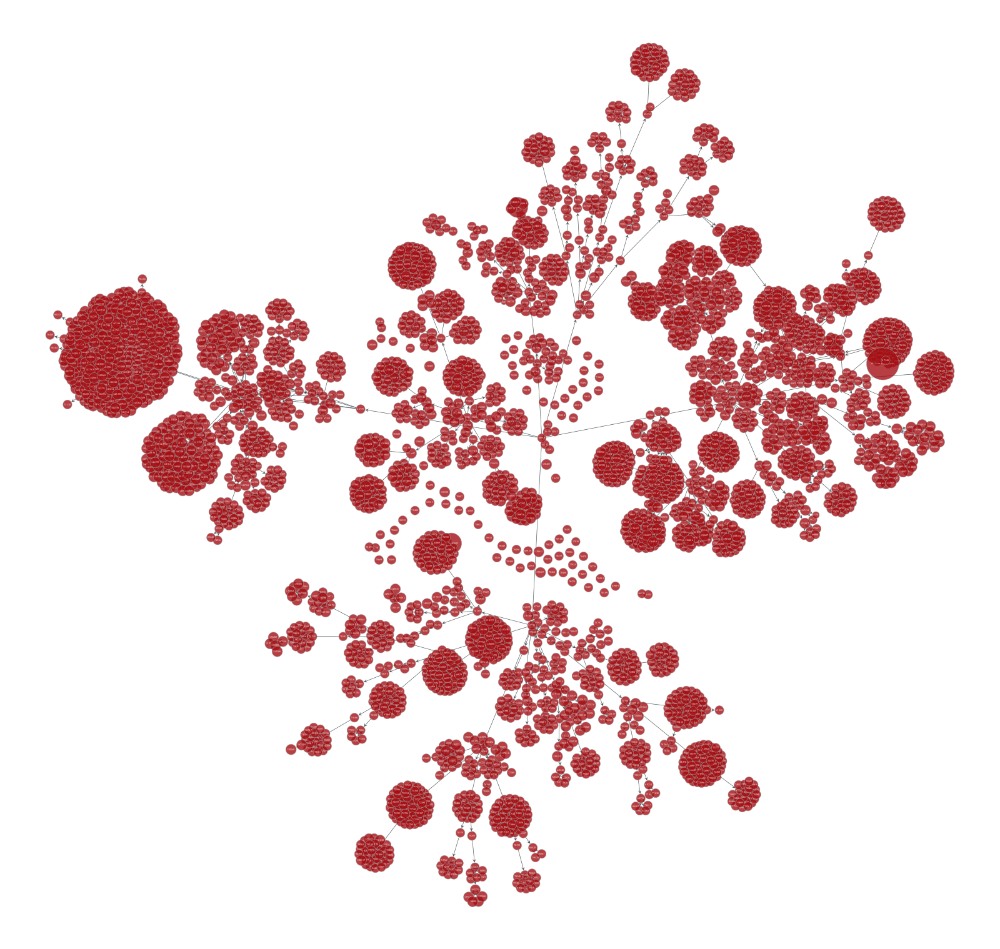

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x35e6281d0, at 0x105bd8b00>

In [25]:
graph_draw(gv_chebi, vertex_text=gv_chebi.vp["chebi_id"], output_size=(800, 800))

In [26]:
# root_nodes = [v for v in gv_chebi.vertices() if v.in_degree() == 0 and v.out_degree() == 0]
# root_nodes

In [27]:
# def inspect_properties(graph, vertex):
#     node_properties = {prop_name: prop[vertex] for prop_name, prop in graph.vertex_properties.items()}
#     print(node_properties)

# inspect_properties(gv_chebi, vertex=root_nodes[0])

In [28]:
import lipinet.network

root_nodes = lipinet.network.get_root_nodes(gv_chebi)
print(len(root_nodes))

for rn in root_nodes:
    multinet.inspect_properties(rn)
    print(f"Out degree of node: {rn.out_degree()}, In degree of node: {rn.in_degree()}")

85
{'layer': 'swisslipids', 'authority': 'swisslipids', 'node_type': 'swisslipid', 'node_id': 'SLM:000000471', 'chebi_id': '17030'}
Out degree of node: 0, In degree of node: 0
{'layer': 'swisslipids', 'authority': 'swisslipids', 'node_type': 'swisslipid', 'node_id': 'SLM:000000472', 'chebi_id': '15576'}
Out degree of node: 0, In degree of node: 0
{'layer': 'swisslipids', 'authority': 'swisslipids', 'node_type': 'swisslipid', 'node_id': 'SLM:000000957', 'chebi_id': '77888'}
Out degree of node: 1, In degree of node: 0
{'layer': 'swisslipids', 'authority': 'swisslipids', 'node_type': 'swisslipid', 'node_id': 'SLM:000389145', 'chebi_id': '18059'}
Out degree of node: 8, In degree of node: 0
{'layer': 'swisslipids', 'authority': 'swisslipids', 'node_type': 'swisslipid', 'node_id': 'SLM:000389240', 'chebi_id': '52323'}
Out degree of node: 0, In degree of node: 0
{'layer': 'swisslipids', 'authority': 'swisslipids', 'node_type': 'swisslipid', 'node_id': 'SLM:000389253', 'chebi_id': '75579'}
Out

This is pretty good, but we can also see above that a small number of the nodes are completely isolated components. For this reason, we need a method that searches for the nodes with the chebi ids in this case (or any node property), and traces up to the root node, keeping the intermediary nodes as well

In [29]:
# let's find the root node
root_nodes = lipinet.network.get_root_nodes(multinet.graph)
print(len(root_nodes))

for rn in root_nodes:
    multinet.inspect_properties(rn)
    print(f"Node idx: {rn}, Out degree of node: {rn.out_degree()}, In degree of node: {rn.in_degree()}")

13
{'layer': 'swisslipids', 'authority': 'swisslipids', 'node_type': 'swisslipid', 'node_id': 'SLM:000389145', 'chebi_id': '18059'}
Node idx: 387180, Out degree of node: 8, In degree of node: 0
{'layer': 'swisslipids', 'authority': 'swisslipids', 'node_type': 'swisslipid', 'node_id': 'SLM:000782223', 'chebi_id': '139573'}
Node idx: 779143, Out degree of node: 4, In degree of node: 0
{'layer': 'swisslipids', 'authority': '', 'node_type': '', 'node_id': 'SLM:000501265', 'chebi_id': ''}
Node idx: 779249, Out degree of node: 2, In degree of node: 0
{'layer': 'swisslipids', 'authority': '', 'node_type': '', 'node_id': 'SLM:000782334', 'chebi_id': ''}
Node idx: 779250, Out degree of node: 4, In degree of node: 0
{'layer': 'swisslipids', 'authority': '', 'node_type': '', 'node_id': 'SLM:000782330', 'chebi_id': ''}
Node idx: 779251, Out degree of node: 1, In degree of node: 0
{'layer': 'swisslipids', 'authority': '', 'node_type': '', 'node_id': 'SLM:000782335', 'chebi_id': ''}
Node idx: 779252

We see above that there are multiple putative root nodes (with an in degree of 0). For our graph, the first one is the only 'true' root node. Note that it seems all of these nodes were created during the node creation from earlier, where they came up as warnings. For now, leaving them in but only using the SwissLipids 'Lipid' entry (SLM:000389145) as the actual real node should be fine. 

Also, later we may want to fill in the authority or node type components since these are mandatory.

In [30]:
# one way of doing this kind of thing, but for now our gv_chebi is the better option bc. we can easily exclude those that do _not_ have a CHEBI
#import graph_tool.util
# graph_tool.util.find_vertex(g=multinet.graph, prop=multinet.graph.vertex_properties['layer'], match='swisslipids')
# graph_tool.util.find_vertex(g=multinet.graph, prop=multinet.graph.vertex_properties['chebi_id'], match='')

In [31]:
# If we want to test the collect paths with bfs method from the package...
# collect_paths_with_bfs(graph=multinet.graph, root=root_nodes[0], target_nodes=list(gv_chebi.vertices())[:10])

In [32]:
gv_chebi_plus = multinet.extract_subgraph_with_paths(root=root_nodes[0], nodes_of_interest=list(gv_chebi.vertices())[:])

In [33]:
# graph_draw(gv_chebi_plus, vertex_text=gv_chebi_plus.vp["chebi_id"], output_size=(800, 800))

In [34]:
#pos = graph_tool.all.sfdp_layout(gv_chebi_plus)
# pos = graph_tool.all.radial_tree_layout(g=gv_chebi_plus, root=root_nodes[0])
# graph_draw(gv_chebi_plus, pos=pos, vertex_text=gv_chebi_plus.vp["node_id"], vertex_size=1.5, output_size=(1200, 1200))

In [35]:
# Note: Looks very spaced out, not a good visualisation for the multiple components
# pos = graph_tool.all.fruchterman_reingold_layout(g=gv_chebi_plus)
# graph_draw(gv_chebi_plus, pos=pos, vertex_text=gv_chebi.vp["node_id"], vertex_size=1.5, output_size=(1200, 1200))

In [36]:
# Note: Takes over 5min to execute
# pos = graph_tool.all.arf_layout(g=gv_chebi_plus)
# graph_draw(gv_chebi_plus, pos=pos, vertex_text=gv_chebi.vp["node_id"], vertex_size=1.5, output_size=(1200, 1200))

In [37]:
# Note: Crashes the kernel
# pos = graph_tool.all.planar_layout(g=gv_chebi_plus)
# graph_draw(gv_chebi_plus, pos=pos, vertex_text=gv_chebi.vp["node_id"], vertex_size=1.5, output_size=(1200, 1200))

In [38]:
gv_chebi_plus.properties

{('v',
  'layer'): <VertexPropertyMap object with value type 'string', for Graph 0x35e5db200, at 0x35e5db680>,
 ('v',
  'authority'): <VertexPropertyMap object with value type 'string', for Graph 0x35e5db200, at 0x35e628230>,
 ('v',
  'node_type'): <VertexPropertyMap object with value type 'string', for Graph 0x35e5db200, at 0x35e6286b0>,
 ('v',
  'node_id'): <VertexPropertyMap object with value type 'string', for Graph 0x35e5db200, at 0x35e628f50>,
 ('e',
  'weight'): <EdgePropertyMap object with value type 'double', for Graph 0x35e5db200, at 0x35e628da0>,
 ('e',
  'interlayer'): <EdgePropertyMap object with value type 'string', for Graph 0x35e5db200, at 0x35e628b90>,
 ('v',
  'chebi_id'): <VertexPropertyMap object with value type 'string', for Graph 0x35e5db200, at 0x35e6291f0>}

In [39]:
import lipinet.visualisation

# chebi_coloured = lipinet.visualisation.color_nodes(g=gv_chebi_plus, prop_name='chebi_id')
# graph_draw(gv_chebi_plus, vertex_text=gv_chebi_plus.vp["chebi_id"], output_size=(800, 800),
#            vertex_fill_color=chebi_coloured)

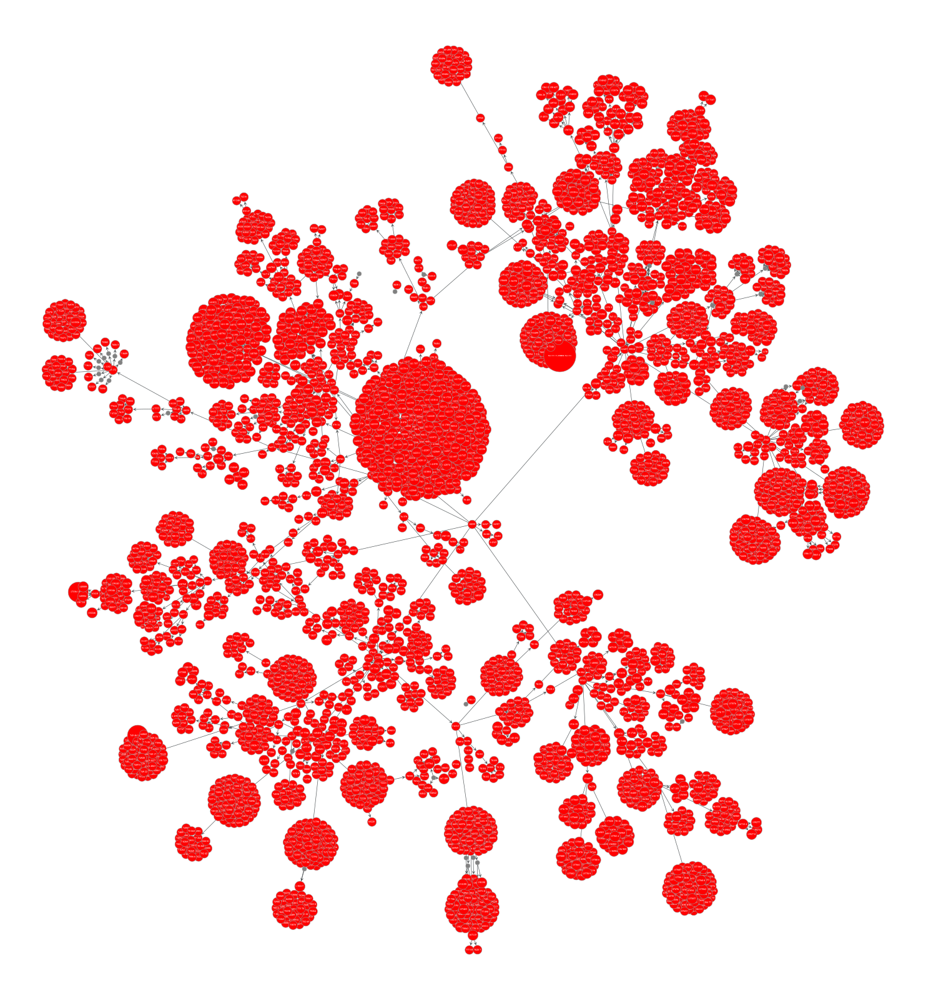

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x35e5db200, at 0x177a91370>

In [40]:
chebi_coloured = lipinet.visualisation.color_nodes(g=gv_chebi_plus, prop_name='chebi_id', method='boolean')
graph_draw(gv_chebi_plus, vertex_text=gv_chebi_plus.vp["chebi_id"], output_size=(800, 800),
           vertex_fill_color=chebi_coloured)

In [41]:
# chebi_coloured = lipinet.visualisation.color_nodes(g=gv_chebi_plus, prop_name='chebi_id', method='boolean')
# graph_draw(gv_chebi_plus, vertex_text=gv_chebi_plus.vp["node_id"], output_size=(800, 800),
#            vertex_fill_color=chebi_coloured)

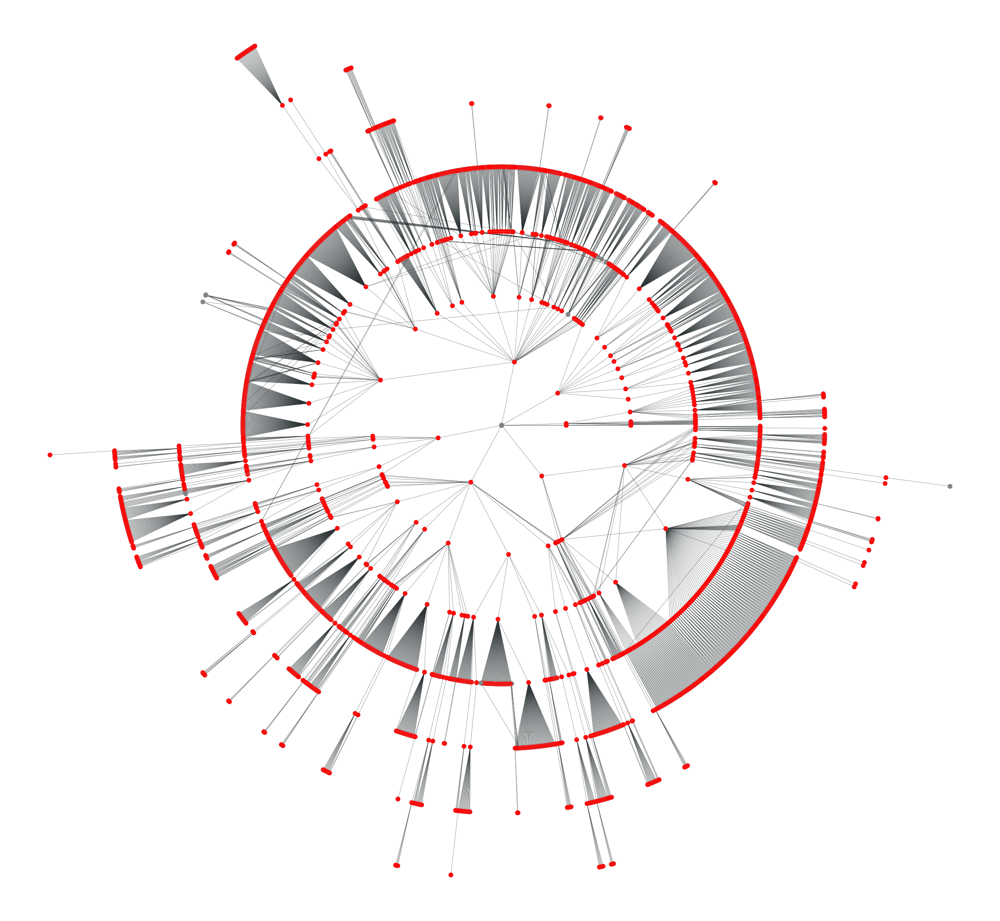

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x35e5db200, at 0x3028c9eb0>

In [42]:
chebi_coloured = lipinet.visualisation.color_nodes(g=gv_chebi_plus, prop_name='chebi_id', method='boolean')
pos = graph_tool.all.radial_tree_layout(g=gv_chebi_plus, root=root_nodes[0])

graph_draw(gv_chebi_plus, 
           pos=pos, 
           vertex_text=gv_chebi_plus.vp["node_id"], 
           vertex_size=1, output_size=(1200, 1200),
           vertex_fill_color=chebi_coloured,
           edge_pen_width=.3)

In [43]:
rdm_lipids = pd.read_csv('../.data/measured/SC_example_Custom_SwissLipidsReferences_lowestLevelID.tsv', header=None)
rdm_lipids.columns = ['measured_swisslipid_id']
rdm_lipids

,measured_swisslipid_id
0,SLM:000500357
1,SLM:000056515
2,SLM:000478818
3,SLM:000500364
4,SLM:000058220
...,...
552,SLM:000308861
553,SLM:000308983
554,SLM:000325930
555,SLM:000325215


Now we want to get from these collection of IDs, to a vertext list, and probably also include the chebi paths from earlier, before mapping back to the root node via bfs...

In [44]:
multinet.node_map[('swisslipids','SLM:000000002')]

<Vertex object with index '0' at 0x392d271c0>

In [45]:
measured_nodes = [multinet.node_map[('swisslipids',item)] for item in rdm_lipids['measured_swisslipid_id'] if isinstance(item, str)] # exclude any null values
print(len(measured_nodes))
measured_nodes

556


[<Vertex object with index '497676' at 0x3549e4440>,
 <Vertex object with index '56036' at 0x3365ba540>,
 <Vertex object with index '476415' at 0x3545f69c0>,
 <Vertex object with index '497683' at 0x3549e47c0>,
 <Vertex object with index '57741' at 0x33660c0c0>,
 <Vertex object with index '64985' at 0x336764340>,
 <Vertex object with index '64202' at 0x33673b840>,
 <Vertex object with index '56104' at 0x3365c07c0>,
 <Vertex object with index '57363' at 0x3365fc240>,
 <Vertex object with index '56065' at 0x3365bb3c0>,
 <Vertex object with index '55970' at 0x3365b8440>,
 <Vertex object with index '388383' at 0x3535bdf40>,
 <Vertex object with index '325066' at 0x35160bb40>,
 <Vertex object with index '57317' at 0x3365f6ac0>,
 <Vertex object with index '70272' at 0x33685ab40>,
 <Vertex object with index '56137' at 0x3365c1840>,
 <Vertex object with index '388533' at 0x3535c2ac0>,
 <Vertex object with index '55990' at 0x3365b8e40>,
 <Vertex object with index '56742' at 0x3365dc940>,
 <Vert

In [46]:
gv_measured = multinet.extract_subgraph_with_paths(root=root_nodes[0], nodes_of_interest=measured_nodes)

In [47]:
root_nodes[0]

<Vertex object with index '387180' at 0x35e5ceb40>

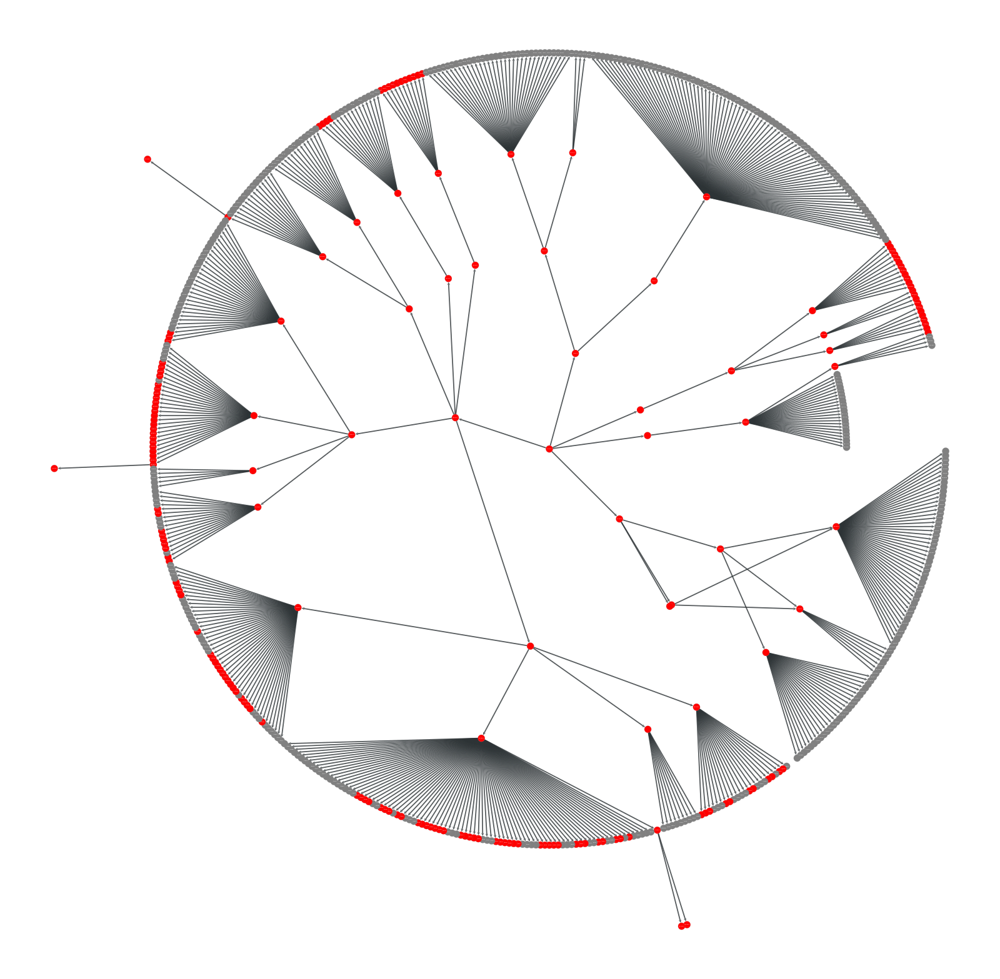

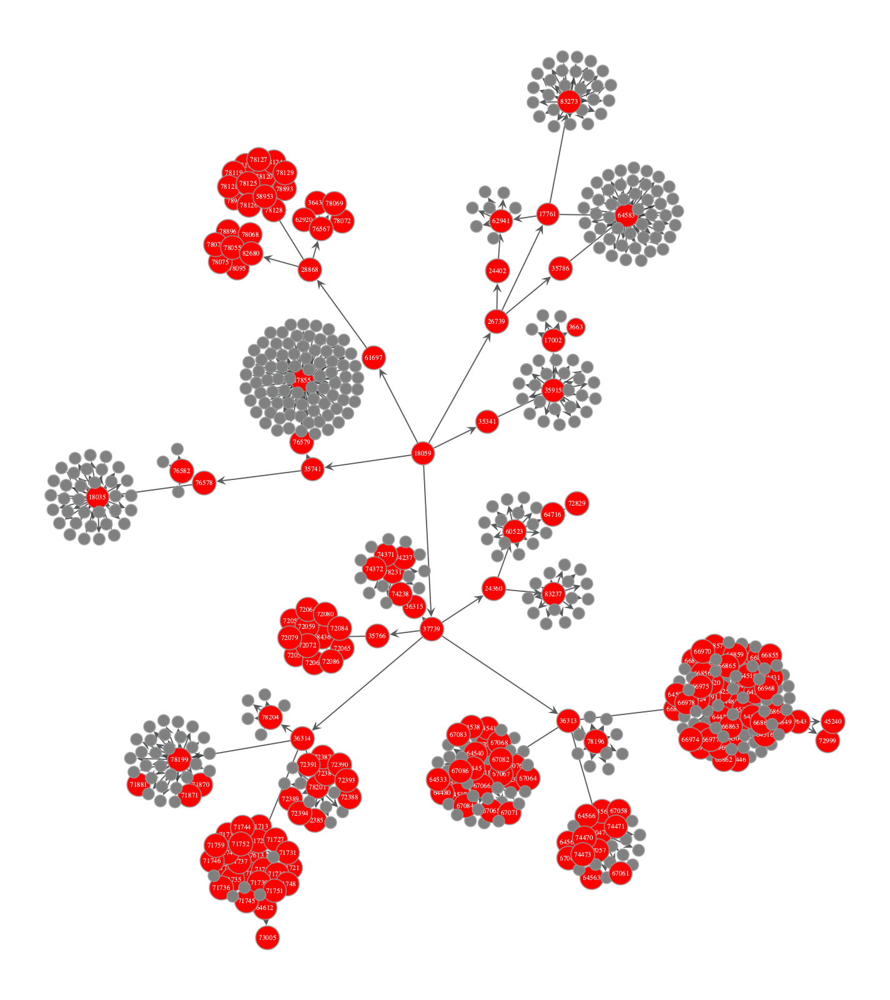

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x3028f3e00, at 0x1784090a0>

In [48]:
chebi_coloured_measured = lipinet.visualisation.color_nodes(g=gv_measured, prop_name='chebi_id', method='boolean')

pos_radial = graph_tool.all.radial_tree_layout(g=gv_measured, root=root_nodes[0])
graph_draw(gv_measured, 
           pos=pos_radial, 
           vertex_text=gv_measured.vp["node_id"], 
           vertex_size=1, output_size=(800, 800),
           vertex_fill_color=chebi_coloured_measured,
           edge_pen_width=.9)

pos_sfdp = graph_tool.all.sfdp_layout(gv_measured, pos=pos_radial, multilevel=True)
graph_draw(gv_measured, 
           pos=pos_sfdp,
           vertex_text=gv_measured.vp["chebi_id"], 
           output_size=(800, 800),
           vertex_fill_color=chebi_coloured_measured)

This is very interesting. What if we now want to know at what levels our measured data was at?

In [49]:
rdm_lipids

,measured_swisslipid_id
0,SLM:000500357
1,SLM:000056515
2,SLM:000478818
3,SLM:000500364
4,SLM:000058220
...,...
552,SLM:000308861
553,SLM:000308983
554,SLM:000325930
555,SLM:000325215


In [50]:
# note this approach isn't that scalable or efficient, but it probably suffices for now
measured_dict = dict(df_swisslipids.apply(lambda x: (x['Lipid ID'], {'measured': True if x['Lipid ID'] in rdm_lipids['measured_swisslipid_id'].to_numpy() else False}), axis=1).to_list())
len(measured_dict)

779249

In [51]:
measured_ids = [item for item in measured_dict if measured_dict[item]['measured']==True]
print(len(measured_ids))
print(measured_ids[:5])

556
['SLM:000000505', 'SLM:000000510', 'SLM:000000812', 'SLM:000001254', 'SLM:000001256']


In [52]:
# [item for item in measured_dict if measured_dict[item]['measured']==True]

In [53]:
df_swisslipids_has_measured = df_swisslipids[df_swisslipids['Lipid ID'].isin(measured_ids)]
df_swisslipids_has_measured.head(5)

# Also equivalent to:
# df_swisslipids_has_measured = df_swisslipids[df_swisslipids['Lipid ID'].isin([item for item in measured_dict if measured_dict[item]['measured']==True])]
# df_swisslipids_has_measured.head(5)

,Lipid ID,Level,Name,Abbreviation*,Synonyms*,Lipid class*,Parent,Components*,SMILES (pH7.3),InChI (pH7.3),...,Exact m/z of [M+Li]+,Exact m/z of [M+NH4]+,Exact m/z of [M-H]-,Exact m/z of [M+Cl]-,Exact m/z of [M+OAc]-,CHEBI,LIPID MAPS,HMDB,MetaNetX,PMID
230,SLM:000000505,Isomeric subspecies,"1,2-dihexadecanoyl-sn-glycero-3-phosphocholine",PC(16:0/16:0),Phosphatidylcholine (16:0/16:0),SLM:000000261,SLM:000088143,SLM:000000510 (sn1 or sn2),CCCCCCCCCCCCCCCC(=O)OC[C@H](COP([O-])(=O)OCC[N...,InChI=1S/C40H80NO8P/c1-6-8-10-12-14-16-18-20-2...,...,740.577637,751.596008,NaN,768.531555,792.575989,72999,LMGP01010564,HMDB00564,MNXM32122,10079112 | 10231538 | 10320809 | 10455175 | 10...
235,SLM:000000510,Isomeric subspecies,hexadecanoate,FA(16:0),Palmitate,SLM:000389800,NaN,NaN,CCCCCCCCCCCCCCCC([O-])=O,InChI=1S/C16H32O2/c1-2-3-4-5-6-7-8-9-10-11-12-...,...,263.255686,274.274056,255.232954,291.209632,315.254083,7896,LMFA01010001,HMDB00220,MNXM108,10198260 | 10231538 | 10320809 | 10358058 | 10...
493,SLM:000000812,Isomeric subspecies,"1,2-dihexadecanoyl-sn-glycero-3-phospho-(1'-sn...",PG(16:0/16:0),Phosphatidylglycerol (16:0/16:0),SLM:000000240,SLM:000100751,SLM:000000510 (sn1 or sn2),CCCCCCCCCCCCCCCC(=O)OC[C@H](COP([O-])(=O)OC[C@...,InChI=1S/C38H75O10P/c1-3-5-7-9-11-13-15-17-19-...,...,729.525269,740.543640,721.502502,757.479187,781.523621,72829,LMGP04010986,HMDB10570,MNXM32179,15485873 | 16704971 | 19075029
781,SLM:000001254,Species,octanoate,FA(8:0),fatty acid (8:0),SLM:000389800,NaN,NaN,[O-]C([*])=O,InChI=none,...,151.130485,162.148855,143.107753,179.084431,203.128883,78117,NaN,NaN,MNXM155972,NaN
783,SLM:000001256,Species,dodecanoate,FA(12:0),fatty acid (12:0),SLM:000389800,NaN,NaN,[O-]C([*])=O,InChI=none,...,207.193086,218.211456,199.170354,235.147031,259.191483,78119,NaN,NaN,MNXM155956,NaN


In [ ]:
# Let's update the layer to include a node property that says whether the lipid was measured or not. In the future, this could be it's own method perhaps.

multinet.build_layer(layer_data=[(item, "swisslipid") for item in df_swisslipids_has_measured['Lipid ID']], 
                     layer_name='swisslipids', 
                     authority='swisslipids', 
                     custom_properties=measured_dict,
                     verbose=False)

In [55]:
multinet.graph.properties

{('v',
  'layer'): <VertexPropertyMap object with value type 'string', for Graph 0x39bb62d50, at 0x39bb62db0>,
 ('v',
  'authority'): <VertexPropertyMap object with value type 'string', for Graph 0x39bb62d50, at 0x39bb62f30>,
 ('v',
  'node_type'): <VertexPropertyMap object with value type 'string', for Graph 0x39bb62d50, at 0x39bb62f60>,
 ('v',
  'node_id'): <VertexPropertyMap object with value type 'string', for Graph 0x39bb62d50, at 0x39bb62f90>,
 ('e',
  'weight'): <EdgePropertyMap object with value type 'double', for Graph 0x39bb62d50, at 0x1557e3440>,
 ('e',
  'interlayer'): <EdgePropertyMap object with value type 'string', for Graph 0x39bb62d50, at 0x39bb62fc0>,
 ('v',
  'chebi_id'): <VertexPropertyMap object with value type 'string', for Graph 0x39bb62d50, at 0x3028ca570>,
 ('v',
  'measured'): <VertexPropertyMap object with value type 'int32_t', for Graph 0x39bb62d50, at 0x35e5da570>}

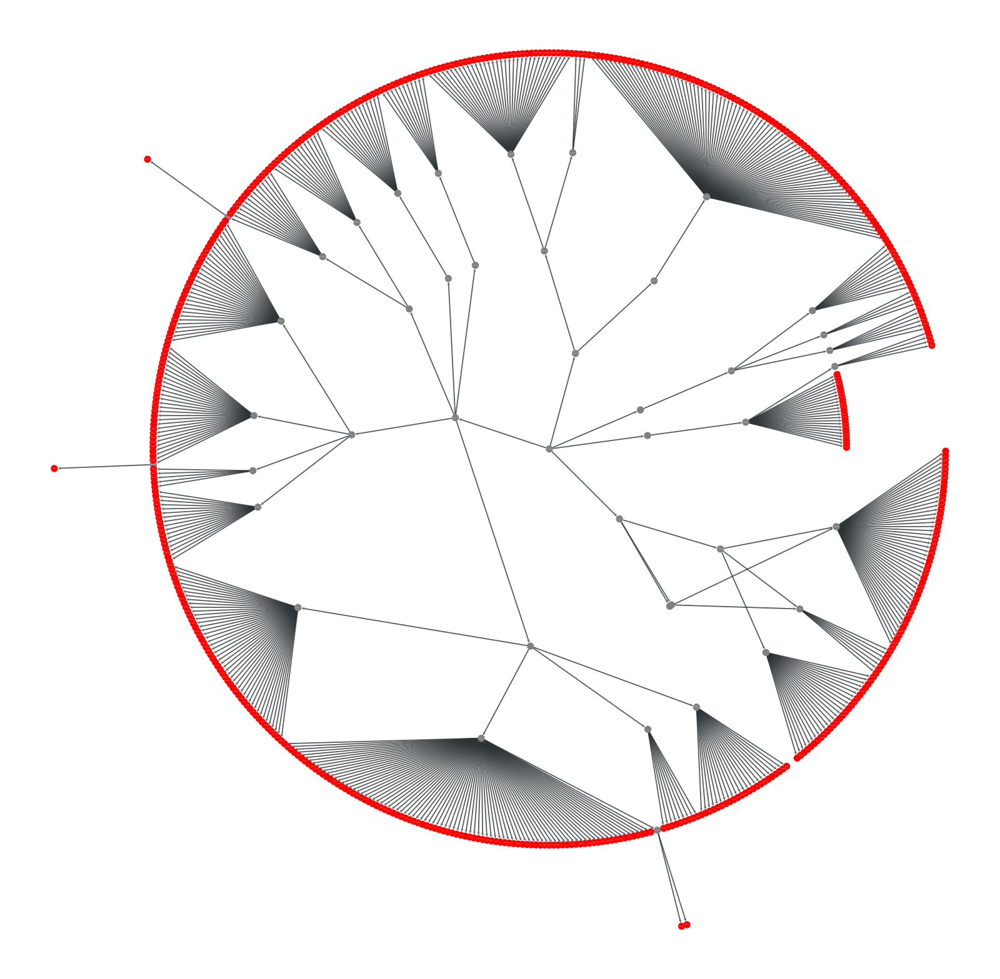

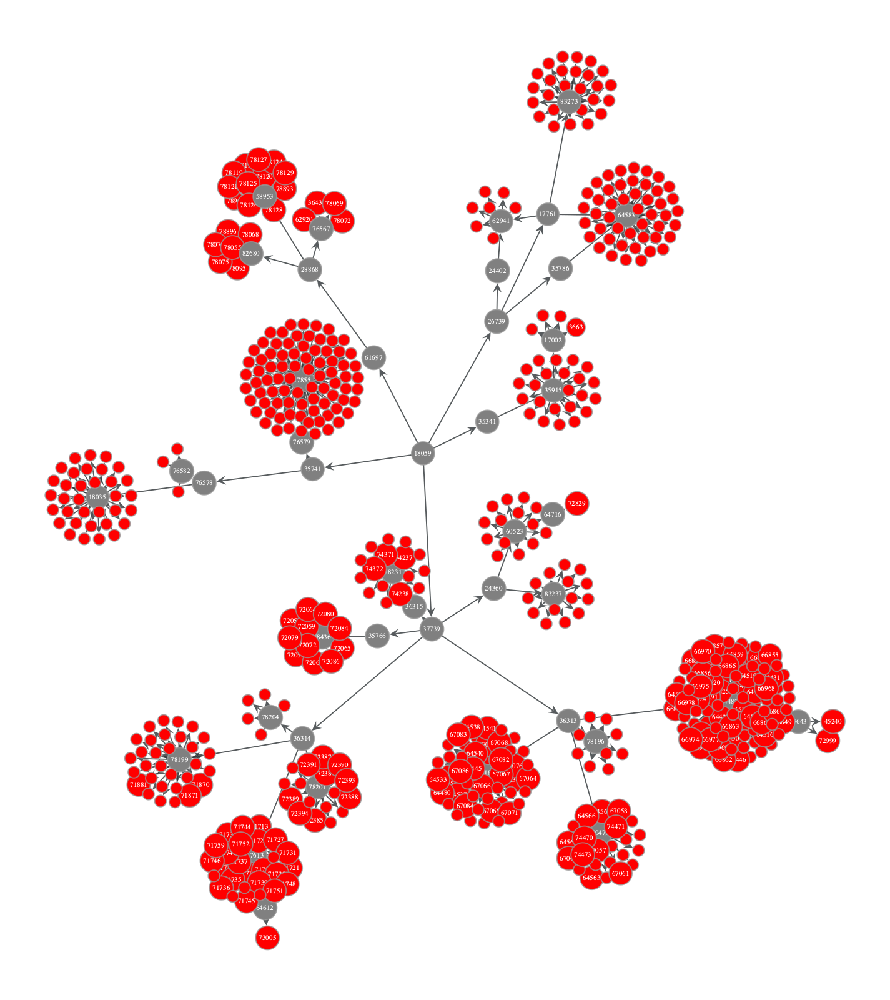

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x35e5d82c0, at 0x30290ce00>

In [56]:
# probs need to redefine gv_measured now that we added the measured property
gv_measured = multinet.extract_subgraph_with_paths(root=root_nodes[0], nodes_of_interest=measured_nodes)

coloured_measured = lipinet.visualisation.color_nodes(g=gv_measured, prop_name='measured', method='boolean')

graph_draw(gv_measured, 
           pos=pos_radial, 
           vertex_text=gv_measured.vp["node_id"], 
           vertex_size=1, output_size=(800, 800),
           vertex_fill_color=coloured_measured,
           edge_pen_width=.9)

graph_draw(gv_measured, 
           pos=pos_sfdp,
           vertex_text=gv_measured.vp["chebi_id"], 
           output_size=(800, 800),
           vertex_fill_color=coloured_measured)

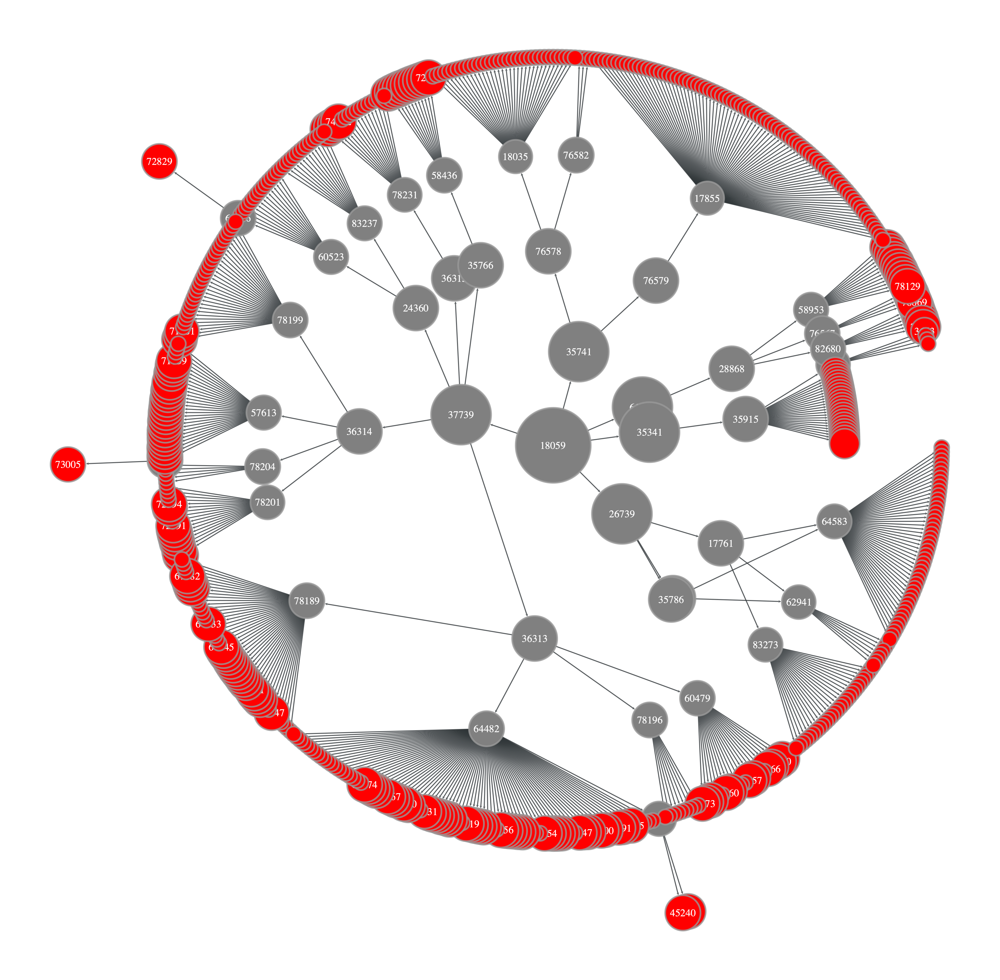

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x35e5d82c0, at 0x30290cd40>

In [57]:
node_sizes_by_level, text_sizes_by_level = set_node_sizes_and_text_by_depth(g=gv_measured, root=root_nodes[0], 
                                                                            max_size=150, min_size=.1,
                                                                            max_text_size=.002, min_text_size=.001)

graph_draw(gv_measured, 
           pos=pos_radial, 
           vertex_text=gv_measured.vp["chebi_id"], 
           vertex_size=node_sizes_by_level, 
        #    vertex_text_size=text_sizes_by_level,
           output_size=(2000, 2000),
           vertex_fill_color=coloured_measured,
           edge_pen_width=2)

In [58]:
df_swisslipids

,Lipid ID,Level,Name,Abbreviation*,Synonyms*,Lipid class*,Parent,Components*,SMILES (pH7.3),InChI (pH7.3),...,Exact m/z of [M+Li]+,Exact m/z of [M+NH4]+,Exact m/z of [M-H]-,Exact m/z of [M+Cl]-,Exact m/z of [M+OAc]-,CHEBI,LIPID MAPS,HMDB,MetaNetX,PMID
0,SLM:000000002,Class,Ceramide (iso-d17:1(4E)),Cer(iso-d17:1(4E)),N-acyl-15-methylhexadecasphing-4-enine,SLM:000399814,NaN,NaN,CC(C)CCCCCCCCC\C=C\[C@@H](O)[C@H](CO)NC([*])=O,InChI=none,...,NaN,NaN,NaN,NaN,NaN,70846,NaN,NaN,MNXM97012,| 11443131 | 14685263 | 18390550 | 21325339 |...
1,SLM:000000003,Isomeric subspecies,15-methylhexadecasphing-4-enine,NaN,NaN,SLM:000390097,NaN,NaN,CC(C)CCCCCCCCC\C=C\[C@@H](O)[C@@H]([NH3+])CO,InChI=1S/C17H35NO2/c1-15(2)12-10-8-6-4-3-5-7-9...,...,292.282235,303.300605,284.259503,320.236181,344.280632,70771,NaN,NaN,MNXM57784,19372430
2,SLM:000000006,Isomeric subspecies,15-methylhexadecasphinganine,NaN,NaN,SLM:000390097,NaN,NaN,CC(C)CCCCCCCCCCC[C@@H](O)[C@@H]([NH3+])CO,InChI=1S/C17H37NO2/c1-15(2)12-10-8-6-4-3-5-7-9...,...,294.297885,305.316255,286.275153,322.251831,346.296282,70829,NaN,NaN,MNXM97029,19372430
3,SLM:000000007,Class,Sphingomyelin (iso-d17:1(4E)),SM(iso-d17:1(4E)),N-acyl-15-methylhexadecasphing-4-enine-1-phosp...,SLM:000001000,NaN,NaN,CC(C)CCCCCCCCC\C=C\[C@@H](O)[C@H](COP([O-])(=O...,InChI=none,...,NaN,NaN,NaN,NaN,NaN,70775,NaN,NaN,MNXM97113,14685263 | 21926990 | 9603947
4,SLM:000000035,Isomeric subspecies,sphinganine,NaN,NaN,SLM:000390097,NaN,NaN,CCCCCCCCCCCCCCC[C@@H](O)[C@@H]([NH3+])CO,InChI=1S/C18H39NO2/c1-2-3-4-5-6-7-8-9-10-11-12...,...,308.313535,319.331905,300.290803,336.267481,360.311932,57817,LMSP01020001,HMDB00269,MNXM302,10652340 | 10702247 | 10751414 | 10802064 | 10...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
779244,SLM:000782324,NaN,apo carotenoid,NaN,NaN,SLM:000508864,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,53183,NaN,NaN,NaN,NaN
779245,SLM:000782325,NaN,terpenoid,NaN,NaN,SLM:000508864,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,26873,NaN,NaN,NaN,NaN
779246,SLM:000782326,NaN,C-45 isoprenoid,NaN,NaN,SLM:000508864,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,87168,NaN,NaN,NaN,NaN
779247,SLM:000782327,NaN,gamma-lactone,NaN,NaN,SLM:000782238,NaN,NaN,O1C(C(C(C1=O)*)*)*,NaN,...,NaN,NaN,NaN,NaN,NaN,37581,NaN,NaN,NaN,NaN


In [59]:
df_swisslipids['Level'].value_counts(dropna=False)

Level
Isomeric subspecies      592413
Structural subspecies    111867
Molecular subspecies      62516
Species                   10347
NaN                        1293
Class                       806
Category                      7
Name: count, dtype: int64

Given that there are so many values for all of these, it will not be super easy to filter the df (for extra efficiency in the build_layer operation) based on NA values alone. For this reason, let's build the dictionary for all values, but filter the df based on nodes in our subgraph.

In [60]:
import lipinet.utils


levels_dict = lipinet.utils.prepare_property_dict_from_df(df=df_swisslipids, 
                                            id_col='Lipid ID', 
                                            target_col='Level', 
                                            operation='use_as_is', 
                                            property_name='level', 
                                            input_list=None)['property_dict']
print(len(levels_dict))

779249


In [61]:
# Double check the overlap between the measured ids and the gv_measured (which includes intermediaries)
# these are not the same, so we should use the gv nodes, which is a wider scope in this case
print(len(set(measured_ids)))
print(len(set(list(gv_measured.vp['node_id']))))
print(len(set(list(gv_measured.vp['node_id'])) & set(measured_ids)))

556
599
556


In [62]:
df_swisslipids_has_measured_bfs = df_swisslipids[df_swisslipids['Lipid ID'].isin(list(gv_measured.vp['node_id']))]
df_swisslipids_has_measured_bfs

,Lipid ID,Level,Name,Abbreviation*,Synonyms*,Lipid class*,Parent,Components*,SMILES (pH7.3),InChI (pH7.3),...,Exact m/z of [M+Li]+,Exact m/z of [M+NH4]+,Exact m/z of [M-H]-,Exact m/z of [M+Cl]-,Exact m/z of [M+OAc]-,CHEBI,LIPID MAPS,HMDB,MetaNetX,PMID
47,SLM:000000239,Class,"1,2-diacyl-sn-glycero-3-phosphoethanolamine",PE,Phosphatidylethanolamine,SLM:000055213,NaN,NaN,[NH3+]CCOP([O-])(=O)OC[C@@H](COC([*])=O)OC([*])=O,InChI=none,...,NaN,NaN,NaN,NaN,NaN,64612,NaN,NaN,MNXM32127,15897609 | 16478722 | 17890783 | 18629440 | 18...
48,SLM:000000240,Class,"1,2-diacyl-sn-glycero-3-phospho-(1'-sn-glycerol)",PG,Phosphatidylglycerol,SLM:000055215,NaN,NaN,OC[C@H](O)COP([O-])(=O)OC[C@@H](COC([*])=O)OC(...,InChI=none,...,NaN,NaN,NaN,NaN,NaN,64716,NaN,NaN,MNXM101192,16547353 | 18434318 | 19075029 | 20485265 | ...
55,SLM:000000261,Class,"1,2-diacyl-sn-glycero-3-phosphocholine",PC,Phosphatidylcholine,SLM:000055211,NaN,NaN,C[N+](C)(C)CCOP([O-])(=O)OC[C@@H](COC([*])=O)O...,InChI=none,...,NaN,NaN,NaN,NaN,NaN,57643,NaN,NaN,MNXM110,10848624 | 12055623 | 14685263 | 14976195 | 15...
146,SLM:000000400,Class,Triacylglycerol,TAG | TG,NaN,SLM:000117141,NaN,NaN,[*]C(=O)OCC(COC([*])=O)OC([*])=O,InChI=none,...,NaN,NaN,NaN,NaN,NaN,17855,NaN,NaN,MNXM248,12682047 | 16135509 | 16150821 | 21704635 | 27...
147,SLM:000000401,Class,Diacylglycerol,DAG | DG,NaN,SLM:000117140,NaN,NaN,[*]OCC(CO[*])O[*],InChI=none,...,NaN,NaN,NaN,NaN,NaN,18035,NaN,NaN,MNXM59,12682047 | 16135509 | 16150821 | 27247428 | 29...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497690,SLM:000500371,Molecular subspecies,Sterol ester (27:1/24:4),SE(27:1/24:4),NaN,SLM:000000974,SLM:000500436,SLM:000001286 (acyl),NaN,NaN,...,735.662587,746.680957,727.639855,763.616533,787.660985,NaN,NaN,NaN,MNXM682895,NaN
497691,SLM:000500372,Molecular subspecies,Sterol ester (27:1/24:1),SE(27:1/24:1),NaN,SLM:000000974,SLM:000500437,SLM:000001285 (acyl),NaN,NaN,...,741.709538,752.727908,733.686806,769.663483,793.707935,NaN,NaN,NaN,MNXM682894,NaN
497694,SLM:000500375,Molecular subspecies,Sterol ester (27:1/26:5),SE(27:1/26:5),NaN,SLM:000000974,SLM:000500440,SLM:000001292 (acyl),NaN,NaN,...,761.678237,772.696608,753.655506,789.632183,813.676635,NaN,NaN,NaN,MNXM682901,NaN
497695,SLM:000500376,Molecular subspecies,Sterol ester (27:1/26:4),SE(27:1/26:4),NaN,SLM:000000974,SLM:000500441,SLM:000001291 (acyl),NaN,NaN,...,763.693888,774.712258,755.671156,791.647833,815.692285,NaN,NaN,NaN,MNXM682900,NaN


In [63]:
multinet.build_layer(layer_data=[(item, "swisslipid") for item in df_swisslipids_has_measured_bfs['Lipid ID']], 
                     layer_name='swisslipids', 
                     authority='swisslipids', 
                     custom_properties=levels_dict,
                     verbose=False) 

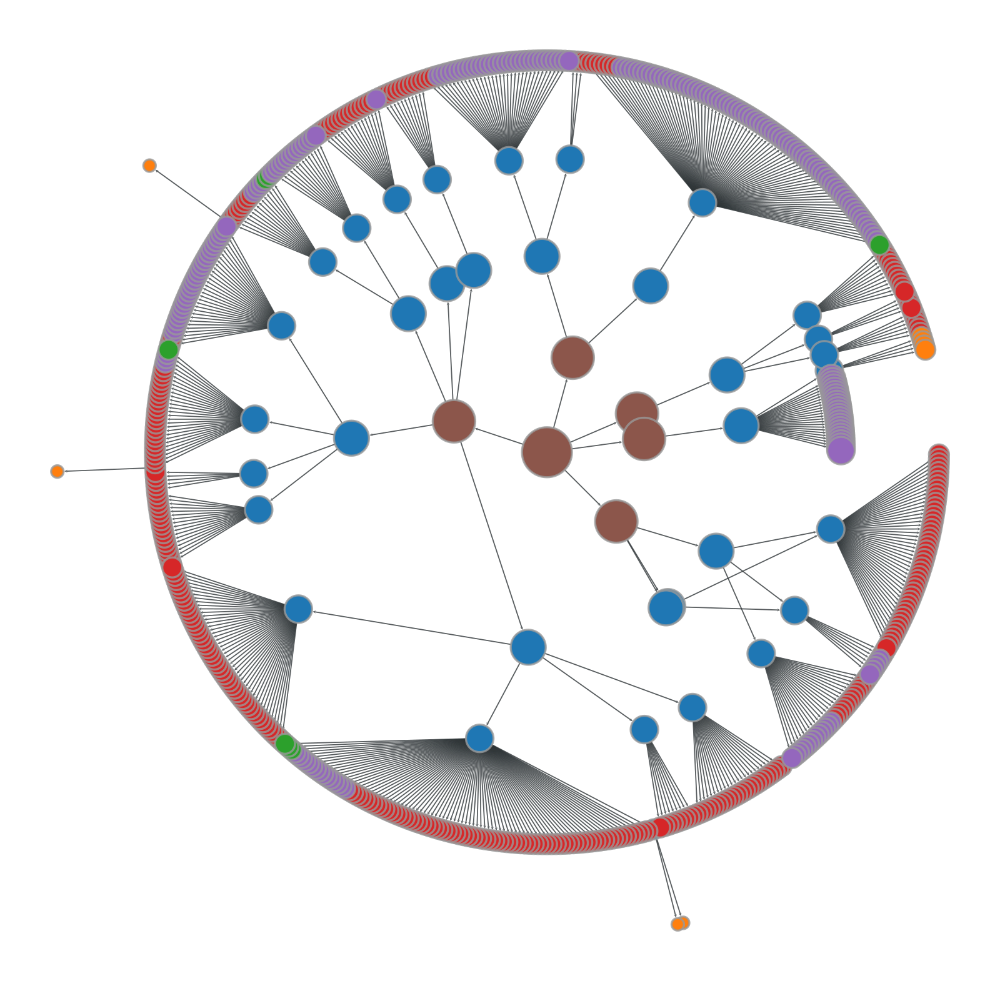

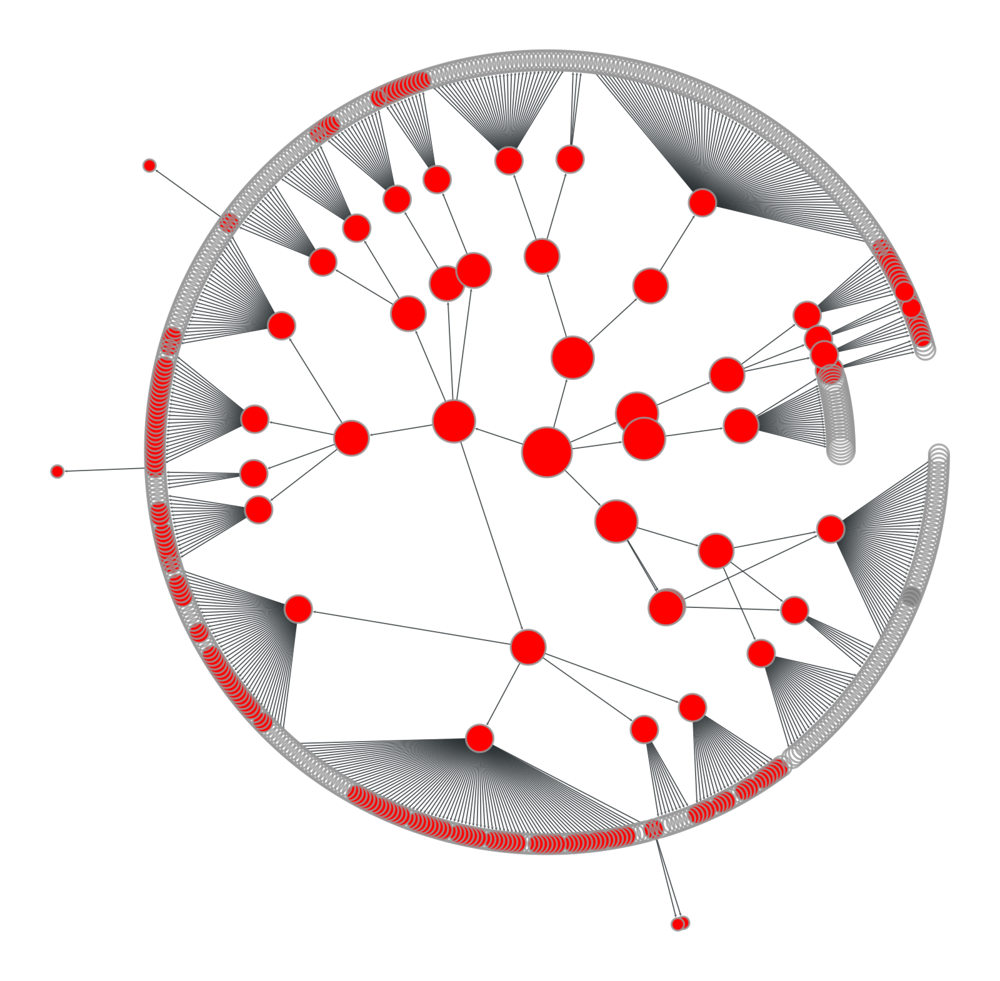

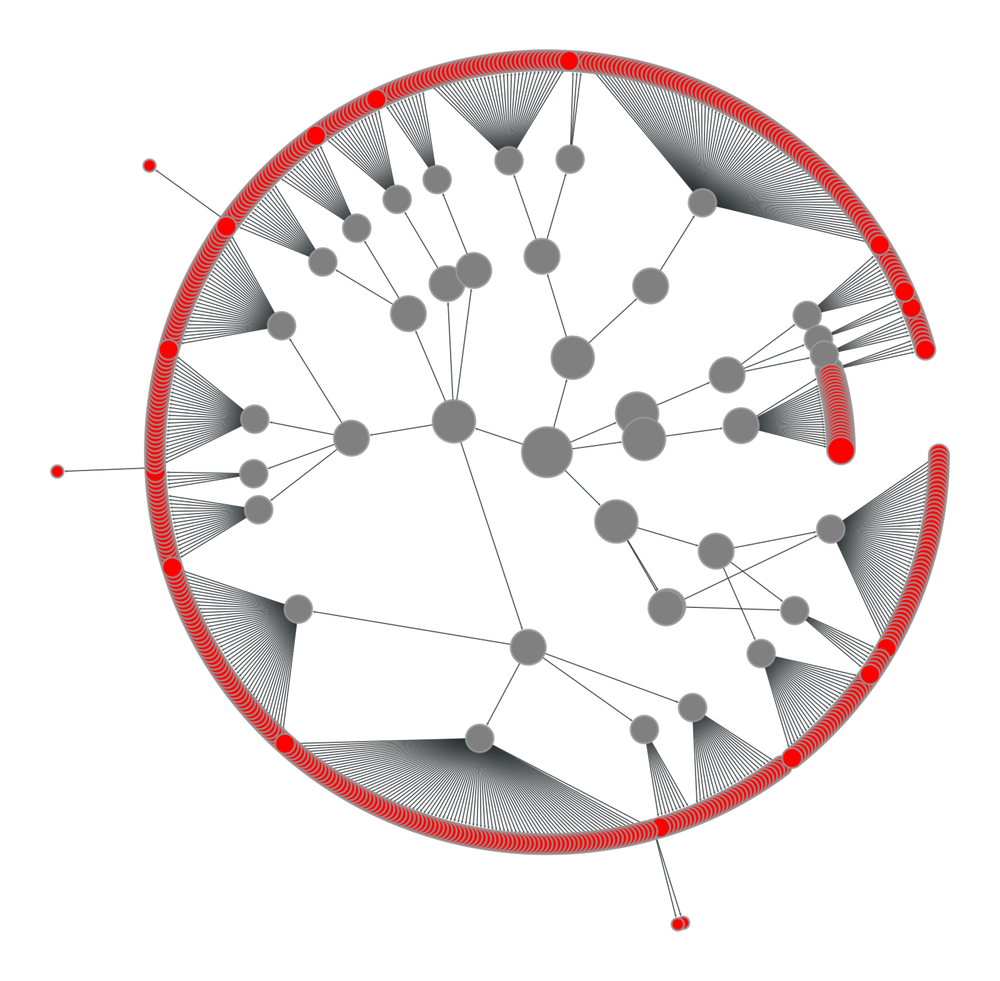

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x35e62b740, at 0x1779f50a0>

In [64]:
# need to redefine gv_measured now that we added the level property
gv_measured = multinet.extract_subgraph_with_paths(root=root_nodes[0], nodes_of_interest=measured_nodes)

levels_coloured_measured = lipinet.visualisation.color_nodes(g=gv_measured, prop_name='level', method='categorical')

node_sizes_by_level, text_sizes_by_level = set_node_sizes_and_text_by_depth(g=gv_measured, root=root_nodes[0], 
                                                                            max_size=40, min_size=10,
                                                                            max_text_size=50, min_text_size=5)

pos_radial = graph_tool.all.radial_tree_layout(g=gv_measured, root=root_nodes[0])
graph_draw(gv_measured, 
           pos=pos_radial, 
           #vertex_text=gv_measured.vp["node_id"], 
           vertex_size=node_sizes_by_level, 
           output_size=(800, 800),
           vertex_fill_color=levels_coloured_measured,
           edge_pen_width=.9)

graph_draw(gv_measured, 
           pos=pos_radial, 
           #vertex_text=gv_measured.vp["node_id"], 
           vertex_size=node_sizes_by_level, 
           output_size=(800, 800),
           vertex_fill_color=chebi_coloured,
           edge_pen_width=.9)

graph_draw(gv_measured, 
           pos=pos_radial, 
           #vertex_text=gv_measured.vp["node_id"], 
           vertex_size=node_sizes_by_level, 
           output_size=(800, 800),
           vertex_fill_color=coloured_measured,
           edge_pen_width=.9)

In [65]:
# Now let's get the colours from this
import matplotlib.cm as cm  # To use color maps

categories = set(gv_measured.vp['level'])
# Use a predefined color map (e.g., tab10) for distinct color assignment to each category
color_map = {cat: cm.tab10(i % 10) for i, cat in enumerate(categories)}
color_map

{'Class': (np.float64(0.12156862745098039),
  np.float64(0.4666666666666667),
  np.float64(0.7058823529411765),
  np.float64(1.0)),
 'Isomeric subspecies': (np.float64(1.0),
  np.float64(0.4980392156862745),
  np.float64(0.054901960784313725),
  np.float64(1.0)),
 'Structural subspecies': (np.float64(0.17254901960784313),
  np.float64(0.6274509803921569),
  np.float64(0.17254901960784313),
  np.float64(1.0)),
 'Species': (np.float64(0.8392156862745098),
  np.float64(0.15294117647058825),
  np.float64(0.1568627450980392),
  np.float64(1.0)),
 'Molecular subspecies': (np.float64(0.5803921568627451),
  np.float64(0.403921568627451),
  np.float64(0.7411764705882353),
  np.float64(1.0)),
 'Category': (np.float64(0.5490196078431373),
  np.float64(0.33725490196078434),
  np.float64(0.29411764705882354),
  np.float64(1.0))}

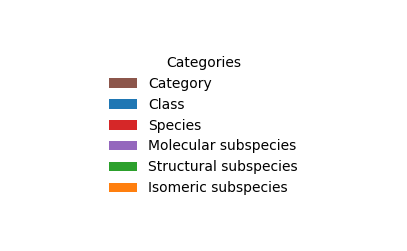

In [66]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Create a list of legend patches
# legend_elements = [Patch(facecolor=color[:3], label=category)  # Use RGB only
#                    for category, color in color_map.items()]

# Create legend elements in the specified order
ordered_categories = ['Category', 'Class', 'Species', 'Molecular subspecies', 'Structural subspecies', 'Isomeric subspecies']
legend_elements = [Patch(facecolor=color_map[cat][:3], label=cat) for cat in ordered_categories]

# Plot the legend
plt.figure(figsize=(5, 3))
plt.legend(handles=legend_elements, title="Categories", loc="center", frameon=False)
plt.axis("off")  # Hide axes for a clean legend display
plt.show()